## Advanced Lane Finding Project

The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

### Camera Calibration

#### 1. Briefly state how you computed the camera matrix and distortion coefficients. Provide an example of a distortion corrected calibration image.

#### Finding Corners

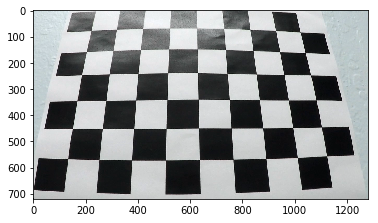

In [1]:
import cv2
import glob
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
%matplotlib inline
import pickle
import sys
import os
import numpy as np


# Make a list of calibration images
fname = "camera_cal/calibration3.jpg"
img = cv2.imread(fname)
plt.imshow(img)

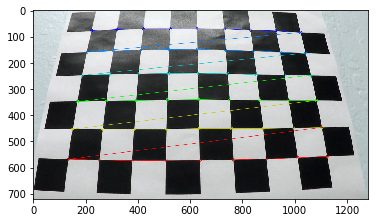

In [2]:
# prepare object points
nx = 9 
ny = 6

# Convert to grayscale
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# Find the chessboard corners
ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)

# If found, draw corners
if ret == True:
    # Draw and display the corners
    cv2.drawChessboardCorners(img, (nx, ny), corners, ret)
    plt.imshow(img)

In [3]:
# all images to get objpoints and imgpoints
nx = 9  #num of inside corners in x
ny = 6  #num of inside corners in y
objp = np.zeros((nx*ny,3), np.float32)
objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)
# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

# Make a list of calibration images
images = glob.glob('camera_cal/calibration*.jpg')
# Step through the list and search for chessboard corners
for idx, fname in enumerate(images):
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (nx,ny), None)

    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)

        # Draw and display the corners
        cv2.drawChessboardCorners(img, (nx,ny), corners, ret)

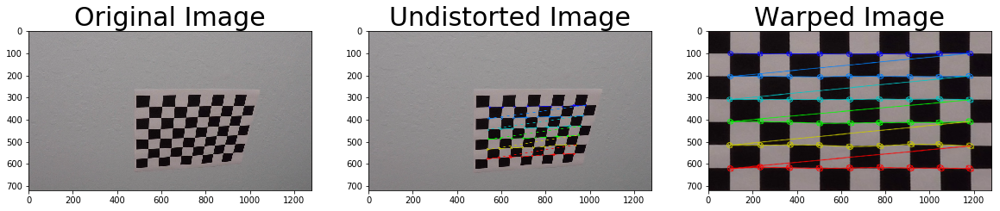

In [4]:
# calculate distortion coefficients, and test undistortion on one of the images
def undistort_image(img, mtx, dist):
    # Function to undistort image
    undist_img = cv2.undistort(img, mtx, dist, None, mtx)
    return undist_img

def gaussian_blur(img, kernel=5):
    # Function to smooth image
    blur = cv2.GaussianBlur(img,(kernel,kernel),0)
    return blur

def corners_unwarp(img, mtx, dist,nx=9, ny=6):
     # Use the OpenCV undistort() function to remove distortion
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    # Convert undistorted image to grayscale
    gray = cv2.cvtColor(undist, cv2.COLOR_BGR2GRAY)
    # Search for corners in the grayscaled image
    ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)

    if ret == True:
        # If we found corners, draw them! (just for fun)
        cv2.drawChessboardCorners(undist, (nx, ny), corners, ret)
        # Choose offset from image corners to plot detected corners
        # This should be chosen to present the result at the proper aspect ratio
        # My choice of 100 pixels is not exact, but close enough for our purpose here
        offset = 100 # offset for dst points
        # Grab the image shape
        img_size = (gray.shape[1], gray.shape[0])

        # For source points I'm grabbing the outer four detected corners
        src = np.float32([corners[0], corners[nx-1], corners[-1], corners[-nx]])
        # For destination points, I'm arbitrarily choosing some points to be
        # a nice fit for displaying our warped result 
        # again, not exact, but close enough for our purposes
        dst = np.float32([[offset, offset], [img_size[0]-offset, offset], 
                                     [img_size[0]-offset, img_size[1]-offset], 
                                     [offset, img_size[1]-offset]])
        # Given src and dst points, calculate the perspective transform matrix
        M = cv2.getPerspectiveTransform(src, dst)
        # Warp the image using OpenCV warpPerspective()
        warped = cv2.warpPerspective(undist, M, img_size)
        return warped, undist , M

# Test undistortion on an image
img_test = cv2.imread('camera_cal/calibration10.jpg')
img_test_size = (img_test.shape[1], img_test.shape[0])

# Do camera calibration given object points and image points
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_test_size,None,None)
dst, undist , M = corners_unwarp(img_test, mtx, dist) 

# Save the camera calibration result for later use (we won't worry about rvecs / tvecs)
dist_pickle = {}
dist_pickle["mtx"] = mtx
dist_pickle["dist"] = dist
pickle.dump( dist_pickle, open( "./wide_dist_pickle.p", "wb" ) )



# Visualize undistortion
f, (ax1, ax2,ax3) = plt.subplots(1, 3, figsize=(20,10))
ax1.imshow(img_test)
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(undist)
ax2.set_title('Undistorted Image', fontsize=30)
ax3.imshow(dst)
ax3.set_title('Warped Image', fontsize=30)

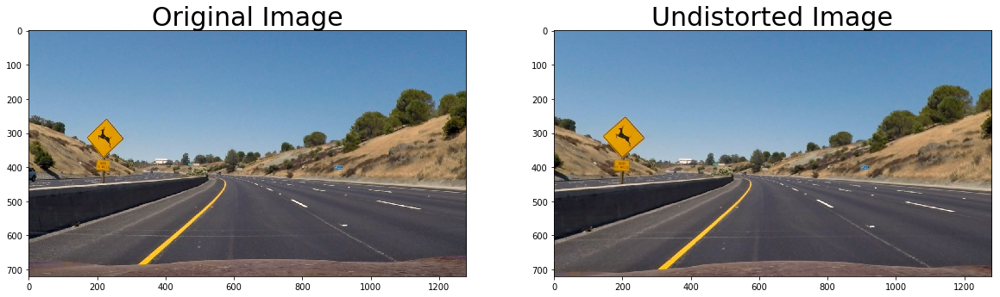

In [5]:
test_img = mpimg.imread('test_images/test2.jpg')
#img_test_size = (test_img.shape[1], test_img.shape[0])
#ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_test_size,None,None)
#dst,M = corners_unwarp(img_test, mtx, dist) 


test_img_undistort = undistort_image(test_img, mtx, dist)

# Visualize undistortion
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
ax1.imshow(test_img)
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(test_img_undistort)
ax2.set_title('Undistorted Image', fontsize=30)

In [6]:
from scipy.misc import imsave

for i in range(1,7):
    test_img = mpimg.imread('test_images/test'+str(i)+'.jpg')
    test_img_undistort = undistort_image(test_img, mtx, dist)
    imsave('output_images/test'+str(i)+'_undistort.png', test_img_undistort)

### Code Refactoring  

In [7]:
def camera_calibration(folderpath, ny=6, nx=9):
    """
    Calculates the camera matrix and the distortion coefficients and saves them for later use in the correction.
    Inputs:
    - folderpath : Path to folder with camera calibration images
    """
    cal_images = glob.glob(folderpath + '/calibration*.jpg')
    image_points, object_points = [], []
    # Prepare checkerboard points
    objp = np.zeros((nx * ny, 3), np.float32)
    objp[:, :2] = np.mgrid[0:nx, 0:ny].T.reshape(-1, 2)
    # Loop over all calibration images and calculate image points
    for img_path in cal_images:
        img = mpimg.imread(img_path)
        gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
        # Find chessboard corners (all edges, not just outer ones)
        ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)

        if ret == True:
            image_points.append(corners)
            object_points.append(objp)
    # Calculate camera matrix and distortion coefficients
    calibration_data = cv2.calibrateCamera(
        object_points, image_points, gray.shape[::-1], None, None)

    pickle.dump(calibration_data, open(folderpath + '/calibration.p', 'wb'))


def load_camera_calibration(folderpath='./camera_cal'):
    return pickle.load(open(folderpath + '/calibration.p', 'rb'))


def correct_distortion(img, mtx=None, dist=None):
    return cv2.undistort(img, mtx, dist, None, mtx)



#### 2. Describe how (and identify where in your code) you used color transforms, gradients or other methods to create a thresholded binary image.  Provide an example of a binary image result.

I used a combination of color and gradient thresholds to generate a binary image ....

In [8]:
# Define a function that takes an image, gradient orientation,
# and threshold min / max values.
def abs_sobel_thresh(img, orient='x', thresh_min=0, thresh_max=255):
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Apply x or y gradient with the OpenCV Sobel() function
    # and take the absolute value
    if orient == 'x':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 1, 0))
    if orient == 'y':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 0, 1))
    # Rescale back to 8 bit integer
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    # Create a copy and apply the threshold
    binary_output = np.zeros_like(scaled_sobel)
    # Here I'm using inclusive (>=, <=) thresholds, but exclusive is ok too
    binary_output[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1

    # Return the result
    return binary_output

def abs_sobel_thresh_2(img, orient='x', sobel_kernel=3, thresh=(0, 255)):
    # Calculate directional gradient
    # Apply threshold
    if orient=='x':
        img_s = cv2.Sobel(img,cv2.CV_64F, 1, 0)
    else:
        img_s = cv2.Sobel(img,cv2.CV_64F, 0, 1)
    img_abs = np.absolute(img_s)
    img_sobel = np.uint8(255*img_abs/np.max(img_abs))
    
    binary_output = 0*img_sobel
    binary_output[(img_sobel >= thresh[0]) & (img_sobel <= thresh[1])] = 1
    return binary_output

# Define a function to return the magnitude of the gradient
# for a given sobel kernel size and threshold values
def mag_thresh(img, sobel_kernel=3, mag_thresh=(0, 255)):
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Take both Sobel x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Calculate the gradient magnitude
    gradmag = np.sqrt(sobelx**2 + sobely**2)
    # Rescale to 8 bit
    scale_factor = np.max(gradmag)/255 
    gradmag = (gradmag/scale_factor).astype(np.uint8) 
    # Create a binary image of ones where threshold is met, zeros otherwise
    binary_output = np.zeros_like(gradmag)
    binary_output[(gradmag >= mag_thresh[0]) & (gradmag <= mag_thresh[1])] = 1

    # Return the binary image
    return binary_output


# Define a function to threshold an image for a given range and Sobel kernel
def dir_threshold(img, sobel_kernel=3, thresh=(0, np.pi/2)):
    # Grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Calculate the x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Take the absolute value of the gradient direction, 
    # apply a threshold, and create a binary image result
    absgraddir = np.arctan2(np.absolute(sobely), np.absolute(sobelx))
    binary_output =  np.zeros_like(absgraddir)
    binary_output[(absgraddir >= thresh[0]) & (absgraddir <= thresh[1])] = 1

    # Return the binary image
    return binary_output


# Define a function that thresholds the S-channel of HLS
# Use exclusive lower bound (>) and inclusive upper (<=)
def hls_select(img, thresh=(0, 255)):
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    s_channel = hls[:,:,2] # S 
    binary_output = np.zeros_like(s_channel)
    binary_output[(s_channel > thresh[0]) & (s_channel <= thresh[1])] = 1
    return binary_output

# Default pipeline.
def pipeline_default(img, s_thresh=(170, 255), sx_thresh=(20, 100)):
    img = np.copy(img)
    # Convert to HSV color space and separate the V channel
    hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HLS).astype(np.float)
    l_channel = hsv[:,:,1]
    s_channel = hsv[:,:,2]
    # Sobel x
    sobelx = cv2.Sobel(l_channel, cv2.CV_64F, 1, 0) # Take the derivative in x
    abs_sobelx = np.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal
    scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))
    
    # Threshold x gradient
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= sx_thresh[0]) & (scaled_sobel <= sx_thresh[1])] = 1
    
    # Threshold color channel
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= s_thresh[0]) & (s_channel <= s_thresh[1])] = 1
    # Stack each channel
    # Note color_binary[:, :, 0] is all 0s, effectively an all black image. It might
    # be beneficial to replace this channel with something else.
    color_binary = np.dstack(( np.zeros_like(sxbinary), sxbinary, s_binary))
    
    # Combine the two binary thresholds
    combined_binary = np.zeros_like(sxbinary)
    combined_binary[(s_binary == 1) | (sxbinary == 1)] = 1

    return color_binary , combined_binary

In [9]:
def color_threshold(img, color_thresh=(0, 255)):
    """
    Calculate threshold on s channel for HLS image
    Inputs:
    - img : Undistorted image
    - color_thresh : Threshold for color channel
    Outputs:
    - Binary mask where color channel is in range of color_thresh
    """
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    s_channel = hls[:, :, 2]

    s_mask = np.zeros_like(s_channel)
    s_mask[(s_channel >= color_thresh[0]) & (s_channel <= color_thresh[1])] = 1

    return s_mask


#### Applying Sobel 

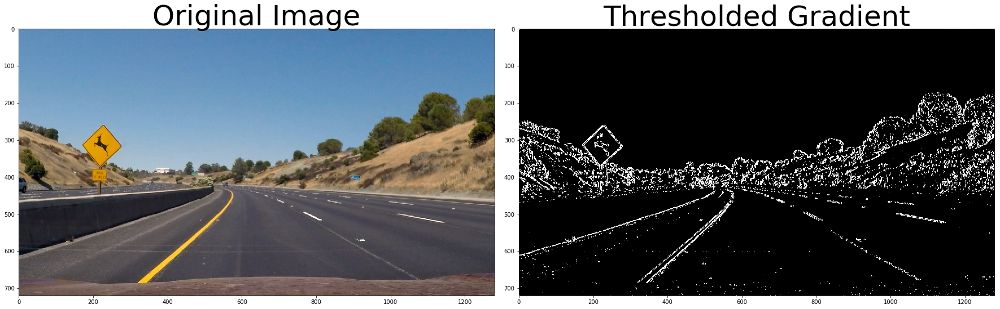

In [10]:
# Read in an image and grayscale it
image = mpimg.imread('test_images/test2.jpg')

# Run the function
grad_binary = abs_sobel_thresh(image, orient='x', thresh_min=20, thresh_max=100)
# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(grad_binary, cmap='gray')
ax2.set_title('Thresholded Gradient', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

### Magnitude of the Gradient

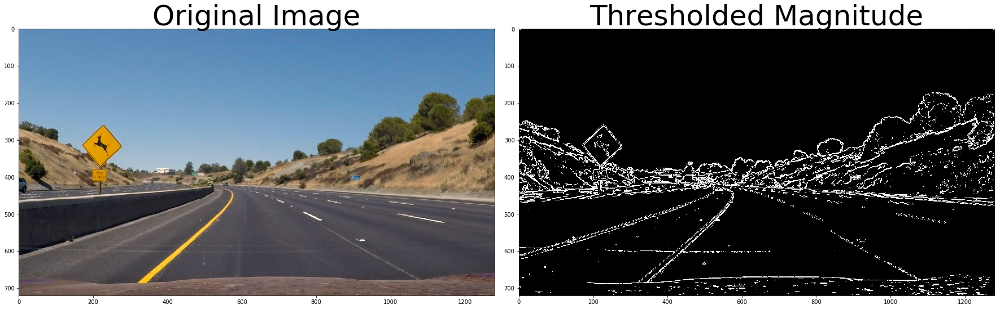

In [11]:
# Read in an image and grayscale it
image = mpimg.imread('test_images/test2.jpg')

# Run the function
mag_binary = mag_thresh(image, sobel_kernel=3, mag_thresh=(30, 100))
# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(mag_binary, cmap='gray')
ax2.set_title('Thresholded Magnitude', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

#### Direction of the Gradient

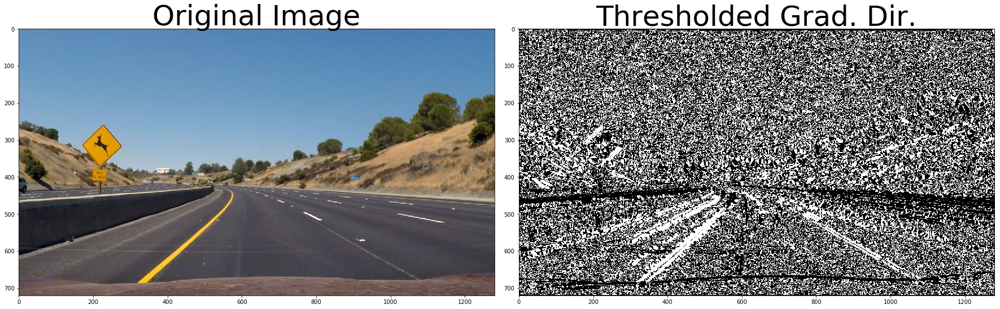

In [12]:
# Read in an image and grayscale it
image = mpimg.imread('test_images/test2.jpg')

# Run the function
dir_binary = dir_threshold(image, sobel_kernel=15, thresh=(0.7, 1.3))
# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(dir_binary, cmap='gray')
ax2.set_title('Thresholded Grad. Dir.', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

#### Combining Thresholds

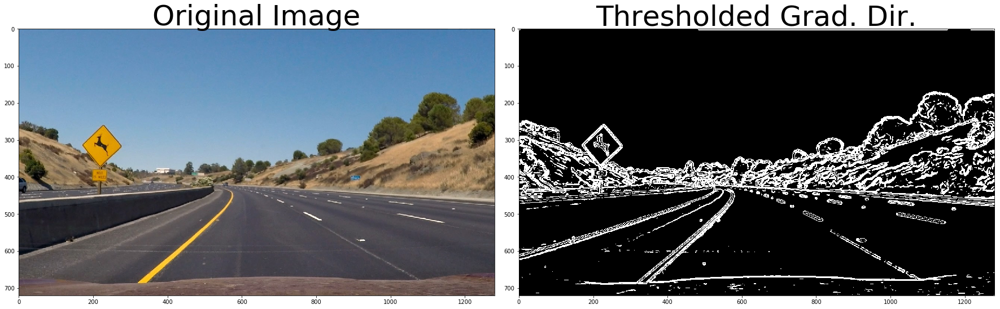

In [13]:
# Read in an image and grayscale it
image = mpimg.imread('test_images/test2.jpg')

# Choose a Sobel kernel size
ksize = 15 

# Apply each of the thresholding functions
gradx = abs_sobel_thresh(image, orient='x', thresh_min=20, thresh_max=100)
grady = abs_sobel_thresh(image, orient='y', thresh_min=20, thresh_max=100)
mag_binary = mag_thresh(image, sobel_kernel=ksize, mag_thresh=(30, 100))
dir_binary = dir_threshold(image, sobel_kernel=ksize, thresh=(0, np.pi/2))

combined = np.zeros_like(dir_binary)
combined[((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1))] = 1

# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(combined, cmap='gray')
ax2.set_title('Thresholded Grad. Dir.', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

#### HLS 

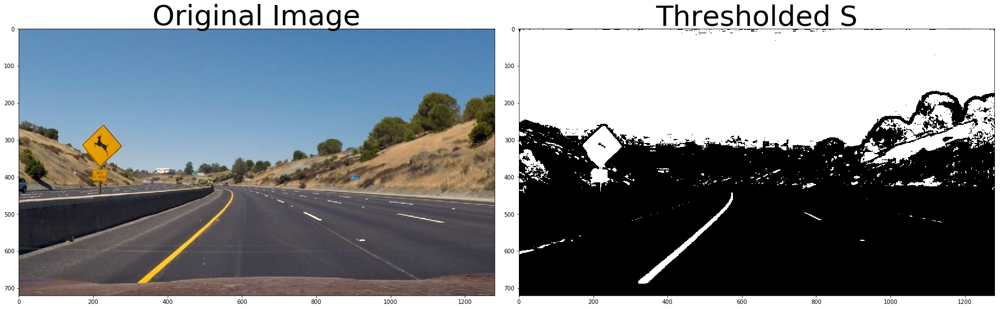

In [14]:
# Read in an image and grayscale it
image = mpimg.imread('test_images/test2.jpg')

hls_binary = hls_select(image, thresh=(90, 255))

# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(hls_binary, cmap='gray')
ax2.set_title('Thresholded S', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)


#### Default Pipeline 

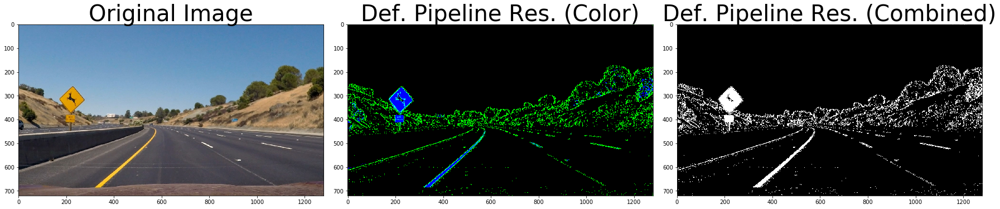

In [15]:
image = mpimg.imread('test_images/test2.jpg')
color_binary , combined_binary = pipeline_default(image)

# Plot the result
f, (ax1, ax2,ax3) = plt.subplots(1, 3, figsize=(24, 9))
f.tight_layout()

ax1.imshow(image)
ax1.set_title('Original Image', fontsize=40)

ax2.imshow(color_binary)
ax2.set_title('Def. Pipeline Res. (Color)', fontsize=40)

ax3.imshow(combined_binary , cmap='gray')
ax3.set_title('Def. Pipeline Res. (Combined)', fontsize=40 )

plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)


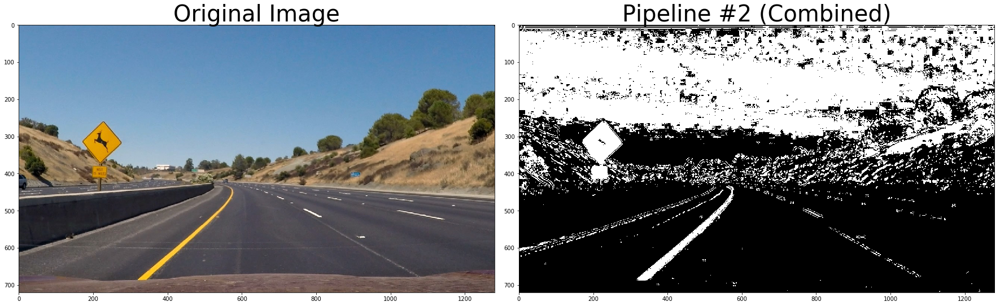

In [16]:
def get_initial_mask(img,window_sz):
    
    # This function gets the initial mask
    
    img = gaussian_blur(img,5)
    img_size = np.shape(img)
    mov_filtsize = img_size[1]/50.
    mean_ln = np.mean(img[int(img_size[0]/2):,:],axis=0)
    mean_ln = moving_average(mean_ln,mov_filtsize)
    
    indexes = find_peaks_cwt(mean_ln,[100], max_distances=[800])

    val_ind = np.array([mean_ln[indexes[i]] for i in range(len(indexes)) ])
    ind_sorted = np.argsort(-val_ind)

    ind_peakR = indexes[ind_sorted[0]]
    ind_peakL = indexes[ind_sorted[1]]
    if ind_peakR<ind_peakL:
        ind_temp = ind_peakR
        ind_peakR = ind_peakL
        ind_peakL = ind_temp

    n_vals = 8
    ind_min_L = ind_peakL-window_sz
    ind_max_L = ind_peakL+window_sz

    ind_min_R = ind_peakR-window_sz
    ind_max_R = ind_peakR+window_sz

    mask_L_i = np.zeros_like(img)
    mask_R_i = np.zeros_like(img)

    ind_peakR_prev = ind_peakR
    ind_peakL_prev = ind_peakL
    
    # Split image into 8 parts and compute histogram on each part
    
    for i in range(8):
        img_y1 = int(img_size[0]-img_size[0]*i/8)
        img_y2 = int(img_size[0]-img_size[0]*(i+1)/8)
    
        mean_lane_y = np.mean(img[img_y2:img_y1,:],axis=0)
        mean_lane_y = moving_average(mean_lane_y,mov_filtsize)
        indexes = find_peaks_cwt(mean_lane_y,[100], max_distances=[800])
        
        if len(indexes)>1.5:
            val_ind = np.array([mean_ln[indexes[i]] for i in range(len(indexes)) ])
            ind_sorted = np.argsort(-val_ind)

            ind_peakR = indexes[ind_sorted[0]]
            ind_peakL = indexes[ind_sorted[1]]
            if ind_peakR<ind_peakL:
                ind_temp = ind_peakR
                ind_peakR = ind_peakL
                ind_peakL = ind_temp
            
        else:
        # If no pixels are found, use previous ones. 
            if len(indexes)==1:
                if (np.abs(indexes[0]-ind_peakR_prev)<np.abs(indexes[0]-ind_peakL_prev)):
                    ind_peakR = indexes[0]
                    ind_peakL = ind_peakL_prev
                else:
                    ind_peakL = indexes[0]
                    ind_peakR = ind_peakR_prev
            else:
                ind_peakL = ind_peakL_prev
                ind_peakR = ind_peakR_prev
            
            
        # If new center is more than 60pixels away, use previous
        # Outlier rejection
        if np.abs(ind_peakL-ind_peakL_prev)>=60:
            ind_peakL = ind_peakL_prev

        if np.abs(ind_peakR-ind_peakR_prev)>=60:
            ind_peakR = ind_peakR_prev
            
    
            
        mask_L_i[img_y2:img_y1,ind_peakL-window_sz:ind_peakL+window_sz] = 1.
        mask_R_i[img_y2:img_y1,ind_peakR-window_sz:ind_peakR+window_sz] = 1.
        
        ind_peakL_prev = ind_peakL
        ind_peakR_prev = ind_peakR
        
    return mask_L_i,mask_R_i



def get_mask_poly(img,poly_fit,window_sz):
    
    # This function returns masks for points used in computing polynomial fit. 
    mask_poly = np.zeros_like(img)
    img_size = np.shape(img)

    poly_pts = []
    pt_y_all = []

    for i in range(8):
        img_y1 = int(img_size[0]-img_size[0]*i/8)
        img_y2 = int(img_size[0]-img_size[0]*(i+1)/8)

        pt_y = int((img_y1+img_y2)/2)
        pt_y_all.append(pt_y)
        poly_pt = int(np.round(poly_fit[0]*pt_y**2 + poly_fit[1]*pt_y + poly_fit[2]))
    
        poly_pts.append(poly_pt)
    
        mask_poly[img_y2:img_y1,poly_pt-window_sz:poly_pt+window_sz] = 1.     

    return mask_poly, np.array(poly_pts),np.array(pt_y_all)
    
def mag_thresh(img, sobel_kernel=3, mag_thresh=(0, 255)):
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Take both Sobel x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Calculate the gradient magnitude
    gradmag = np.sqrt(sobelx**2 + sobely**2)
    # Rescale to 8 bit
    scale_factor = np.max(gradmag)/255 
    gradmag = (gradmag/scale_factor).astype(np.uint8) 
    # Create a binary image of ones where threshold is met, zeros otherwise
    binary_output = np.zeros_like(gradmag)
    binary_output[(gradmag >= mag_thresh[0]) & (gradmag <= mag_thresh[1])] = 1

    # Return the binary image
    return binary_output


def mag_thresh_2(img, sobel_kernel=3, thresh=(0, 255)):
    # Calculate gradient magnitude
    # Apply threshold
    img_sx = cv2.Sobel(img,cv2.CV_64F, 1, 0)
    img_sy = cv2.Sobel(img,cv2.CV_64F, 0, 1)
    
    img_s = np.sqrt(img_sx**2 + img_sy**2)
    img_s = np.uint8(img_s*255/np.max(img_s))
    binary_output = 0*img_s
    binary_output[(img_s>=thresh[0]) & (img_s<=thresh[1]) ]=1
    return binary_output

def mag_thresh(img, sobel_kernel=3, mag_thresh=(0, 255)):
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Take both Sobel x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Calculate the gradient magnitude
    gradmag = np.sqrt(sobelx**2 + sobely**2)
    # Rescale to 8 bit
    scale_factor = np.max(gradmag)/255 
    gradmag = (gradmag/scale_factor).astype(np.uint8) 
    # Create a binary image of ones where threshold is met, zeros otherwise
    binary_output = np.zeros_like(gradmag)
    binary_output[(gradmag >= mag_thresh[0]) & (gradmag <= mag_thresh[1])] = 1

    # Return the binary image
    return binary_output

def dir_threshold_2(img, sobel_kernel=3, thresh=(0, np.pi/2)):
    # Calculate gradient direction
    # Apply threshold
    img_sx = cv2.Sobel(img,cv2.CV_64F,1,0, ksize=sobel_kernel)
    img_sy = cv2.Sobel(img,cv2.CV_64F,0,1, ksize=sobel_kernel)
    
    grad_s = np.arctan2(np.absolute(img_sy), np.absolute(img_sx))
    
    binary_output = 0*grad_s # Remove this line
    binary_output[(grad_s>=thresh[0]) & (grad_s<=thresh[1])] = 1
    return binary_output
    
def GaussianC_Adaptive_Threshold(img,kernel,cut_val):
    # Gaussian adaptive thresholding (NOT USED )
    img_cut = cv2.adaptiveThreshold(img,255,cv2.ADAPTIVE_THRESH_GAUSSIAN_C,\
            cv2.THRESH_BINARY,kernel,cut_val)
    return img_cut



def sobel_combined(image):
    # Combine sobel masks.
    img_g_mag = mag_thresh(image,3,(20,150))
    img_d_mag = dir_threshold_2(image,3,(.6,1.1))
    img_abs_x = abs_sobel_thresh(image,'x',5,(50,200))
    img_abs_y = abs_sobel_thresh(image,'y',5,(50,200))
    sobel_combined = np.zeros_like(img_d_mag)
    sobel_combined[((img_abs_x == 1) & (img_abs_y == 1)) | \
               ((img_g_mag == 1) & (img_d_mag == 1))] = 1
    return sobel_combined


def color_mask(hsv,low,high):
    # Takes in low and high values and returns mask
    mask = cv2.inRange(hsv, low, high)
    return mask

def apply_color_mask(hsv,img,low,high):
    # Takes in color mask and returns image with mask applied.
    mask = cv2.inRange(hsv, low, high)
    res = cv2.bitwise_and(img,img, mask= mask)
    return res


def mag_threshold(img, sobel_kernel=3, mag_thresh=(0, 255)):
    """
    Calculates the magnitude of the sobel derivative and returns threshed values
    Inputs:
    - img : Undistorted image
    - sobel_kernel : Sobel kernel size
    - mag_thresh : Threshold for binarizing magnitude
    Outputs:
    - Binary mask where magnitude is in range of thresh
    """

    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    sobel_x = cv2.Sobel(gray, cv2.CV_64F, 1, 0,  ksize=sobel_kernel)
    sobel_y = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # The magnitude is the square-root of the squared sum
    sobel_magnitude = np.sqrt(np.power(sobel_x, 2) + np.power(sobel_y, 2))
    sobel_magnitude = np.uint8(
        255 * (sobel_magnitude / np.max(sobel_magnitude)))
    # Binarize magnitude
    sobel_mask = np.zeros_like(sobel_magnitude)
    sobel_mask[(sobel_magnitude > mag_thresh[0]) &
               (sobel_magnitude <= mag_thresh[1])] = 1

    return sobel_mask


def abs_sobel_threshold(img, orient='x', sobel_kernel=3,
                        sobel_thresh=(0, 255)):
    """
    Calculate sobel derivation on given orientation
    Inputs:
    - img : Undistorted image
    - orient : Orientation on which to calculate the derivative (x will enhance vertical lines, y enhances horizontal lines)
    - sobel_kernel : Sobel kernel size
    - sobel_thresh : Threshold for binarizing derivative
    Outputs:
    - Binary mask where derivate is in range of sobel_thresh
    """
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    if orient == 'x':
        sobel = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    elif orient == 'y':
        sobel = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    sobel = np.abs(sobel)
    sobel = np.uint8(255 * (sobel / np.max(sobel)))
    # Binarize derivative
    sobel_mask = np.zeros_like(sobel)
    sobel_mask[(sobel > sobel_thresh[0]) & (sobel <= sobel_thresh[1])] = 1

    return sobel_mask


def select_yellow(image):
    hsv = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
    lower = np.array([20,60,60])
    upper = np.array([38,174, 250])
    mask = cv2.inRange(hsv, lower, upper)

    return mask

def select_white(image):
    lower = np.array([202,202,202])
    upper = np.array([255,255,255])
    mask = cv2.inRange(image, lower, upper)

    return mask


def combine_sobel_thresholds(img, opts):
    """
    Combines the sobel derivative, magnitude and direction:
    Inputs:
    - img : Undistorted image
    - options : A dictionary with the values for transforming the image
        - sobel_kernel : Kernel size
        - stx_min, stx_max : Sobel threshold for x
        - sty_min, sty_max : Sobel threshold for y
        - mt_min, mt_max : Magnitude threshold
        - dt_min, dt_max : Direction threshold
    Outputs:
    - Binary mask where all thresholds are met
    """

    # Calculate sobel gradient, magnitude and direction
    gradx = abs_sobel_threshold(img, orient='x', sobel_kernel=opts['sobel_kernel'], sobel_thresh=(
        opts['stx_min'], opts['stx_max']))
    grady = abs_sobel_threshold(img, orient='y', sobel_kernel=opts['sobel_kernel'], sobel_thresh=(
        opts['sty_min'], opts['sty_max']))
    mag_binary = mag_threshold(img, sobel_kernel=opts['sobel_kernel'],
                               mag_thresh=(opts['mt_min'], opts['mt_max']))
    dir_binary = dir_threshold(
        img, sobel_kernel=opts['sobel_kernel'], thresh=(opts['dt_min'], opts['dt_max']))
    color_binary = color_threshold(
        img, color_thresh=(opts['ct_min'], opts['ct_max']))
    # Combine thresholded images
    combined = np.zeros_like(dir_binary)
    # combined[((gradx == 1) & (grady == 1)) | (
    #     (mag_binary == 1) & (dir_binary == 1))] = 1
    combined[((gradx == 1) & (grady == 1) &
              (mag_binary == 1) & (dir_binary == 1)) | (color_binary == 1)] = 1

    return combined


global M_g, Minv_g, mtx_g, dist_g, left_fit_g, right_fit_g, curvature_g
camera_calibration('camera_cal', ny=6, nx=9)
ret, mtx, dist, rvecs, tvecs = load_camera_calibration('camera_cal')


image = mpimg.imread('test_images/test2.jpg')
# Sobel & Color thresholds
opts = {'sobel_kernel': 13, 'stx_min': 20,
        'stx_max': 255, 'sty_min': 20, 'sty_max': 255,
        'mt_min': 20, 'mt_max': 100, 'dt_min': -np.pi / 2, 'dt_max': 1.33,
        'ct_min': 100, 'ct_max': 255}
combined_binary = combine_sobel_thresholds(image,opts)

# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()

ax1.imshow(image)
ax1.set_title('Original Image', fontsize=40)

ax2.imshow(combined_binary , cmap='gray')
ax2.set_title('Pipeline #2 (Combined)', fontsize=40 )

plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)


#### My Pipeline 

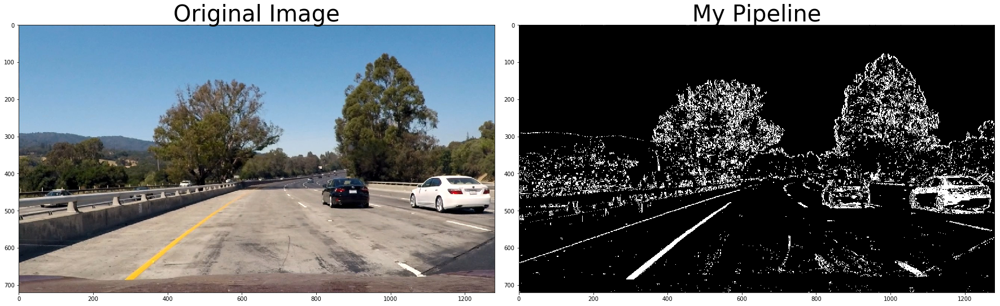

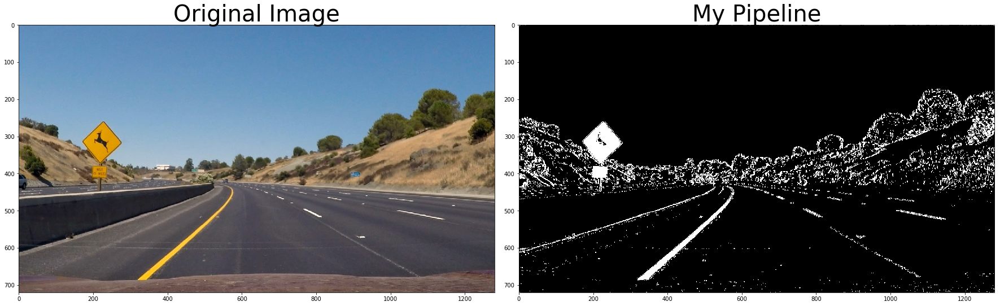

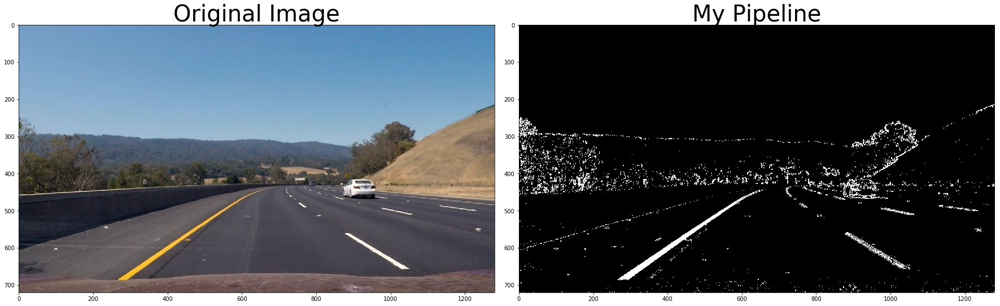

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


In [17]:
def my_pipeline(img, s_thresh=(170, 255), ksize=15, sx_thresh=(20, 100)):
    # Apply each of the thresholding functions
    gradx = abs_sobel_thresh(img, orient='x', thresh_min=20, thresh_max=100)
    grady = abs_sobel_thresh(img, orient='y', thresh_min=20, thresh_max=100)
    mag_binary = mag_thresh(img, sobel_kernel=ksize, mag_thresh=(30, 100))
    dir_binary = dir_threshold(img, sobel_kernel=ksize, thresh=(0, np.pi/2))

    combined = np.zeros_like(dir_binary)
    combined[((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1))] = 1
    
    color_binary , combined_binary = pipeline_default(img)
    #hls_binary = hls_select(image, thresh=(90, 255))
    
    combined_final = np.zeros_like(combined)
    combined_final[combined_binary == 1] = 1
    
    return combined_final


for i in range(1,7):
    image = mpimg.imread('test_images/test'+str(i)+'.jpg')
    comb = my_pipeline(image)
    imsave('output_images/test'+str(i)+'_thresholding.png', comb)
    
    # Plot the result
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(image)
    ax1.set_title('Original Image', fontsize=40)
    ax2.imshow(comb , cmap='gray')
    ax2.set_title('My Pipeline', fontsize=40)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)




#### 3. Describe how (and identify where in your code) you performed a perspective transform and provide an example of a transformed image.

The code for my perspective transform includes a function called `warper()`, which appears in lines 1 through 8 in the file `example.py` (output_images/examples/example.py) (or, for example, in the 3rd code cell of the IPython notebook).  The `warper()` function takes as inputs an image (`img`), as well as source (`src`) and destination (`dst`) points.  I chose the hardcode the source and destination points in the following manner:

```python
src = np.float32(
    [[(img_size[0] / 2) - 55, img_size[1] / 2 + 100],
    [((img_size[0] / 6) - 10), img_size[1]],
    [(img_size[0] * 5 / 6) + 60, img_size[1]],
    [(img_size[0] / 2 + 55), img_size[1] / 2 + 100]])
dst = np.float32(
    [[(img_size[0] / 4), 0],
    [(img_size[0] / 4), img_size[1]],
    [(img_size[0] * 3 / 4), img_size[1]],
    [(img_size[0] * 3 / 4), 0]])
```

This resulted in the following source and destination points:

| Source        | Destination   | 
|:-------------:|:-------------:| 
| 585, 460      | 320, 0        | 
| 203, 720      | 320, 720      |
| 1127, 720     | 960, 720      |
| 695, 460      | 960, 0        |

I verified that my perspective transform was working as expected by drawing the `src` and `dst` points onto a test image and its warped counterpart to verify that the lines appear parallel in the warped image.

---

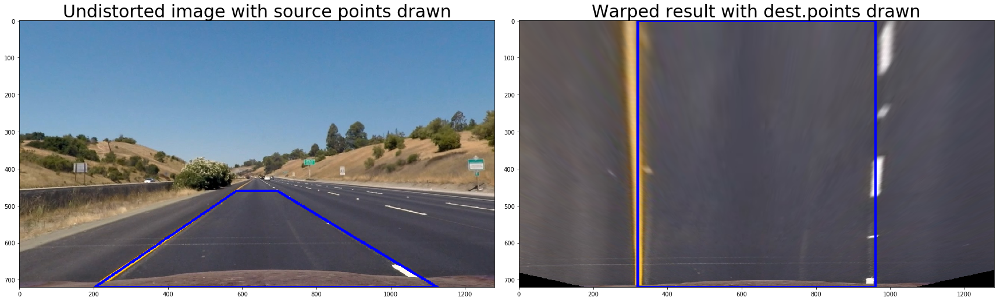

In [18]:
def warp_image(img,src,dst,img_size):
    # Apply perspective transform
    M = cv2.getPerspectiveTransform(src, dst)
    warped = cv2.warpPerspective(img, M, img_size, flags=cv2.INTER_LINEAR)
    Minv = cv2.getPerspectiveTransform(dst, src)

    return warped,M,Minv


def warper(image):
    undist = cv2.undistort(image, mtx, dist, None, mtx)
        # Convert undistorted image to grayscale
    gray = cv2.cvtColor(undist, cv2.COLOR_BGR2GRAY)
        # Search for corners in the grayscaled image
    img_size = (gray.shape[1], gray.shape[0])
    # Given src and dst points, calculate the perspective transform matrix
    
    src = np.float32(
        [[(img_size[0] / 2) - 55, img_size[1] / 2 + 100],
        [((img_size[0] / 6) - 10), img_size[1]],
        [(img_size[0] * 5 / 6) + 60, img_size[1]],
        [(img_size[0] / 2 + 55), img_size[1] / 2 + 100]])
    
    dst = np.float32(
        [[(img_size[0] / 4), 0],
        [(img_size[0] / 4), img_size[1]],
        [(img_size[0] * 3 / 4), img_size[1]],
        [(img_size[0] * 3 / 4), 0]])

    M = cv2.getPerspectiveTransform(src, dst)
    Minv = cv2.getPerspectiveTransform(dst,dst)
    # Warp the image using OpenCV warpPerspective()
    warped = cv2.warpPerspective(undist, M, img_size)
    return warped, undist, src, dst, M, Minv

# straight_lines1.jpg
image                     = mpimg.imread('test_images/straight_lines1.jpg')
warped, undist, src, dst,M,Minv  = warper(image)

src_pts = src.astype(int)
src_pts = src_pts.reshape((-1,1,2))
cv2.polylines(undist,[src_pts],True,(0,0,255),5)

dst_pts = dst.astype(int)
dst_pts = dst_pts.reshape((-1,1,2))
cv2.polylines(warped,[dst_pts],True,(0,0,255),5)

imsave('output_images/straight_lines1_undist.png', undist)
imsave('output_images/straight_lines1_warped.png', warped)

f, (ax1, ax2) = plt.subplots(1,2, figsize=(24,9))
f.tight_layout()
ax1.imshow(undist, cmap="gray")
ax1.set_title('Undistorted image with source points drawn', fontsize = 30)
ax2.imshow(warped, cmap="gray")
ax2.set_title('Warped result with dest.points drawn', fontsize = 30)

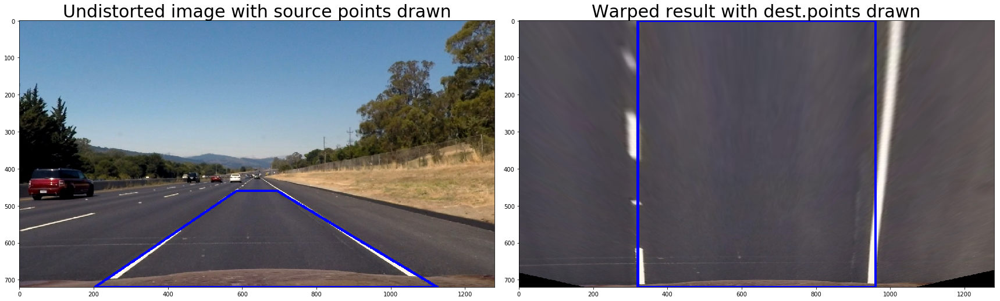

In [19]:
# straight_lines2.jpg
image                     = mpimg.imread('test_images/straight_lines2.jpg')
warped, undist, src, dst, M,Minv  = warper(image)

src_pts = src.astype(int)
src_pts = src_pts.reshape((-1,1,2))
cv2.polylines(undist,[src_pts],True,(0,0,255),5)

dst_pts = dst.astype(int)
dst_pts = dst_pts.reshape((-1,1,2))
cv2.polylines(warped,[dst_pts],True,(0,0,255),5)


imsave('output_images/straight_lines2_undist.png', undist)
imsave('output_images/straight_lines2_warped.png', warped)


f, (ax1, ax2) = plt.subplots(1,2, figsize=(24,9))
f.tight_layout()
ax1.imshow(undist, cmap="gray")
ax1.set_title('Undistorted image with source points drawn', fontsize = 30)
ax2.imshow(warped, cmap="gray")
ax2.set_title('Warped result with dest.points drawn', fontsize = 30)

#### Code refactoring 

In [20]:
def calculate_perspective_matrices(img, src=None, dst=None):
    """
    Performs a perspective transformation on given image
    Inputs:
    - img : Undistorted image
    Outputs:
    - Transformed image
    """
    img_size = (gray.shape[1], gray.shape[0])
    # Given src and dst points, calculate the perspective transform matrix
    
    src = np.float32(
        [[(img_size[0] / 2) - 55, img_size[1] / 2 + 100],
        [((img_size[0] / 6) - 10), img_size[1]],
        [(img_size[0] * 5 / 6) + 60, img_size[1]],
        [(img_size[0] / 2 + 55), img_size[1] / 2 + 100]])
    
    dst = np.float32(
        [[(img_size[0] / 4), 0],
        [(img_size[0] / 4), img_size[1]],
        [(img_size[0] * 3 / 4), img_size[1]],
        [(img_size[0] * 3 / 4), 0]])
    
    
    M = cv2.getPerspectiveTransform(src, dst)
    Minv = cv2.getPerspectiveTransform(dst, src)

    pickle.dump([M, Minv], open('./persp_transform.p', 'wb'))


def load_perspective_matrices():
    M, Minv = pickle.load(open('./persp_transform.p', 'rb'))
    return M, Minv

#### 4. Describe how (and identify where in your code) you identified lane-line pixels and fit their positions with a polynomial?

Then I did some other stuff and fit my lane lines with a 2nd order polynomial kinda like this:

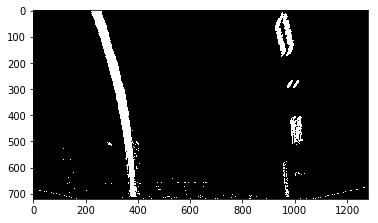

In [21]:
## 
image                     = mpimg.imread('test_images/test2.jpg')
warped, undist, src, dst,M,Minv  = warper(image)

_ , binary_warped = pipeline_default(warped) 
#binary_warped = my_pipeline(warped)
plt.imshow(binary_warped , cmap="gray")

import numpy as np
import cv2
import matplotlib.pyplot as plt

# Assuming you have created a warped binary image called "binary_warped"
# Take a histogram of the bottom half of the image
#histogram = np.sum(binary_warped[binary_warped.shape[0]/2:,:], axis=0)
histogram = np.sum(binary_warped[int(binary_warped.shape[0]/2):,:], axis=0)
# Create an output image to draw on and  visualize the result
out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
# Find the peak of the left and right halves of the histogram
# These will be the starting point for the left and right lines
midpoint = np.int(histogram.shape[0]/2)
leftx_base = np.argmax(histogram[:midpoint])
rightx_base = np.argmax(histogram[midpoint:]) + midpoint

# Choose the number of sliding windows
nwindows = 20
# Set height of windows
window_height = np.int(binary_warped.shape[0]/nwindows)
# Identify the x and y positions of all nonzero pixels in the image
nonzero = binary_warped.nonzero()
nonzeroy = np.array(nonzero[0])
nonzerox = np.array(nonzero[1])
# Current positions to be updated for each window
leftx_current = leftx_base
rightx_current = rightx_base
# Set the width of the windows +/- margin
margin = 100
# Set minimum number of pixels found to recenter window
minpix = 50
# Create empty lists to receive left and right lane pixel indices
left_lane_inds = []
right_lane_inds = []

# Step through the windows one by one
for window in range(nwindows):
    # Identify window boundaries in x and y (and right and left)
    win_y_low = binary_warped.shape[0] - (window+1)*window_height
    win_y_high = binary_warped.shape[0] - window*window_height
    win_xleft_low = leftx_current - margin
    win_xleft_high = leftx_current + margin
    win_xright_low = rightx_current - margin
    win_xright_high = rightx_current + margin
    # Draw the windows on the visualization image
    cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0), 2) 
    cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 2) 
    # Identify the nonzero pixels in x and y within the window
    good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
    good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
    # Append these indices to the lists
    left_lane_inds.append(good_left_inds)
    right_lane_inds.append(good_right_inds)
    # If you found > minpix pixels, recenter next window on their mean position
    if len(good_left_inds) > minpix:
        leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
    if len(good_right_inds) > minpix:        
        rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

# Concatenate the arrays of indices
left_lane_inds = np.concatenate(left_lane_inds)
right_lane_inds = np.concatenate(right_lane_inds)

# Extract left and right line pixel positions
leftx = nonzerox[left_lane_inds]
lefty = nonzeroy[left_lane_inds] 
rightx = nonzerox[right_lane_inds]
righty = nonzeroy[right_lane_inds] 

# Fit a second order polynomial to each
left_fit = np.polyfit(lefty, leftx, 2)
right_fit = np.polyfit(righty, rightx, 2)

(720, 0)

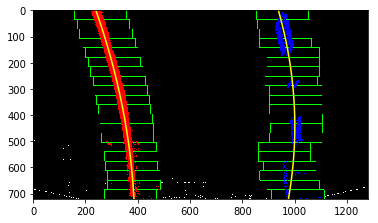

In [22]:
# Generate x and y values for plotting
ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
plt.imshow(out_img)
plt.plot(left_fitx, ploty, color='yellow')
plt.plot(right_fitx, ploty, color='yellow')
plt.xlim(0, 1280)
plt.ylim(720, 0)

(720, 0)

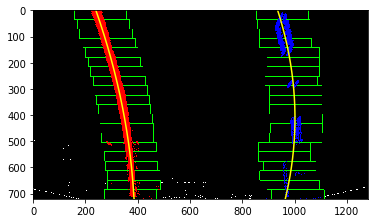

In [23]:
# Assume you now have a new warped binary image 
# from the next frame of video (also called "binary_warped")
# It's now much easier to find line pixels!
nonzero = binary_warped.nonzero()
nonzeroy = np.array(nonzero[0])
nonzerox = np.array(nonzero[1])
margin = 100
left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] + margin))) 
right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] + margin)))  

# Again, extract left and right line pixel positions
leftx = nonzerox[left_lane_inds]
lefty = nonzeroy[left_lane_inds] 
rightx = nonzerox[right_lane_inds]
righty = nonzeroy[right_lane_inds]
# Fit a second order polynomial to each
left_fit = np.polyfit(lefty, leftx, 2)
right_fit = np.polyfit(righty, rightx, 2)
# Generate x and y values for plotting
ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
plt.imshow(out_img)
plt.plot(left_fitx, ploty, color='yellow')
plt.plot(right_fitx, ploty, color='yellow')
plt.xlim(0, 1280)
plt.ylim(720, 0)

(720, 0)

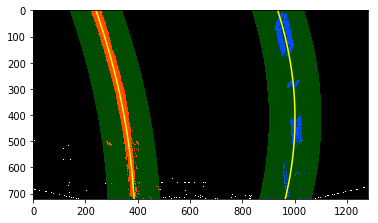

In [24]:
# Skip the sliding windows step once you know where the lines are
# Now you know where the lines are you have a fit! In the next frame of video you don't need to do a blind search again, 
# but instead you can just search in a margin around the previous line position like this

# Create an image to draw on and an image to show the selection window
out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
window_img = np.zeros_like(out_img)
# Color in left and right line pixels
out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

# Generate a polygon to illustrate the search window area
# And recast the x and y points into usable format for cv2.fillPoly()
left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, ploty])))])
left_line_pts = np.hstack((left_line_window1, left_line_window2))
right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, ploty])))])
right_line_pts = np.hstack((right_line_window1, right_line_window2))

# Draw the lane onto the warped blank image
cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
plt.imshow(result)
plt.plot(left_fitx, ploty, color='yellow')
plt.plot(right_fitx, ploty, color='yellow')
plt.xlim(0, 1280)
plt.ylim(720, 0)

#### Code recaftoring

In [25]:
def fit_polynomial(img, nwindows=9, plotit=False):
    """
    Finds the line with the help of an histogram and fits a second order polynomial. Code taken from course page
    Inputs:
    - img : Perspective transformed and undistorted image
    Outputs:
    - left_fit, right_fit : Coefficients of left and right line
    """
    # Assuming you have created a warped binary image called "binary_warped"
    binary_warped = img
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[int(binary_warped.shape[0]/2):,:], axis=0)
    #histogram = np.sum(binary_warped[binary_warped.shape[0] / 2:, :], axis=0)
    # Create an output image to draw on and  visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped)) * 255
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0] / 2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # # Choose the number of sliding windows
    # nwindows = 9
    # Set height of windows
    window_height = np.int(binary_warped.shape[0] / nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window + 1) * window_height
        win_y_high = binary_warped.shape[0] - window * window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        # Draw the windows on the visualization image
        cv2.rectangle(out_img, (win_xleft_low, win_y_low),
                      (win_xleft_high, win_y_high), (0, 255, 0), 2)
        cv2.rectangle(out_img, (win_xright_low, win_y_low),
                      (win_xright_high, win_y_high), (0, 255, 0), 2)
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (
            nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (
            nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean
        # position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds]
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)

    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[
                        0] - 1, binary_warped.shape[0])
    left_fitx = left_fit[0] * ploty**2 + left_fit[1] * ploty + left_fit[2]
    right_fitx = right_fit[0] * ploty**2 + \
        right_fit[1] * ploty + right_fit[2]

    out_img[nonzeroy[left_lane_inds], nonzerox[
        left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[
        right_lane_inds]] = [0, 0, 255]

    if plotit:
        plt.imshow(out_img / 255)
        plt.plot(left_fitx, ploty, color='yellow')
        plt.plot(right_fitx, ploty, color='yellow')
        plt.xlim(0, 1280)
        plt.ylim(720, 0)

    return left_fit, right_fit, (leftx, lefty, rightx, righty, ploty)


def fit_polynomial_consecutive(img, left_fit, right_fit, nwindows=9, plotit=False):
    """
    Finds the line with the help of an histogram and fits a second order polynomial. Takes already found fits
    Inputs:
    - img : Perspective transformed and undistorted image
    Outputs:
    - left_fit, right_fit : Coefficients of left and right line
    """
    # Assume you now have a new warped binary image
    # from the next frame of video (also called "binary_warped")
    # It's now much easier to find line pixels!
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    margin = 100
    left_lane_inds = ((nonzerox > (left_fit[0] * (nonzeroy**2) + left_fit[1] * nonzeroy + left_fit[2] - margin)) & (
        nonzerox < (left_fit[0] * (nonzeroy**2) + left_fit[1] * nonzeroy + left_fit[2] + margin)))
    right_lane_inds = ((nonzerox > (right_fit[0] * (nonzeroy**2) + right_fit[1] * nonzeroy + right_fit[2] - margin)) & (
        nonzerox < (right_fit[0] * (nonzeroy**2) + right_fit[1] * nonzeroy + right_fit[2] + margin)))

    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds]
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0] - 1, binary_warped.shape[0])
    left_fitx = left_fit[0] * ploty**2 + left_fit[1] * ploty + left_fit[2]
    right_fitx = right_fit[0] * ploty**2 + right_fit[1] * ploty + right_fit[2]

    # Create an image to draw on and an image to show the selection window
    out_img = np.dstack(
        (binary_warped, binary_warped, binary_warped)) * 255
    window_img = np.zeros_like(out_img)
    # Color in left and right line pixels
    out_img[nonzeroy[left_lane_inds], nonzerox[
        left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[
        right_lane_inds]] = [0, 0, 255]

    # Generate a polygon to illustrate the search window area
    # And recast the x and y points into usable format for cv2.fillPoly()
    left_line_window1 = np.array(
        [np.transpose(np.vstack([left_fitx - margin, ploty]))])
    left_line_window2 = np.array(
        [np.flipud(np.transpose(np.vstack([left_fitx + margin, ploty])))])
    left_line_pts = np.hstack((left_line_window1, left_line_window2))
    right_line_window1 = np.array(
        [np.transpose(np.vstack([right_fitx - margin, ploty]))])
    right_line_window2 = np.array(
        [np.flipud(np.transpose(np.vstack([right_fitx + margin, ploty])))])
    right_line_pts = np.hstack((right_line_window1, right_line_window2))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(window_img, np.int_([left_line_pts]), (0, 255, 0))
    cv2.fillPoly(window_img, np.int_([right_line_pts]), (0, 255, 0))
    result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
    if plotit:
        plt.imshow(result)
        plt.plot(left_fitx, ploty, color='yellow')
        plt.plot(right_fitx, ploty, color='yellow')
        plt.xlim(0, 1280)
        plt.ylim(720, 0)

    return left_fit, right_fit, (leftx, lefty, rightx, righty, ploty)

#### 5. Describe how (and identify where in your code) you calculated the radius of curvature of the lane and the position of the vehicle with respect to center.



In [26]:
def perspective_transform(img):
	"""
	Execute perspective transform
	"""
	img_size = (img.shape[1], img.shape[0])

	src = np.float32(
		[[200, 720],
		[1100, 720],
		[595, 450],
		[685, 450]])
	dst = np.float32(
		[[300, 720],
		[980, 720],
		[300, 0],
		[980, 0]])

	m = cv2.getPerspectiveTransform(src, dst)
	m_inv = cv2.getPerspectiveTransform(dst, src)

	warped = cv2.warpPerspective(img, m, img_size, flags=cv2.INTER_LINEAR)
	unwarped = cv2.warpPerspective(warped, m_inv, (warped.shape[1], warped.shape[0]), flags=cv2.INTER_LINEAR)  # DEBUG

	return warped, unwarped, m, m_inv



def transform_to_top_view(img, M):
    """
    Performs a perspective transformation on given image
    Inputs:
    - img : Undistorted image
    - M : Transformation matrix
    Outputs:
    - Transformed image
    """
    #im_shape = (img.shape[1], img.shape[0])
    #return cv2.warpPerspective(img, M, im_shape)
    warped, unwarped, m, m_inv = perspective_transform(img)
    return warped
    


def calculate_curvature(img, left_fit, right_fit, fits):
    """
    Calculates curvature for given polynomial fits
    Returns:
    - left_curverad, right_curverad : Radius of curvature in meters
    """
    ploty = np.linspace(0, img.shape[0] - 1, img.shape[0])
    y_eval = img.shape[0]
    ym_per_pix = 30 / 720  # meters per pixel in y dimension
    xm_per_pix = 3.7 / 700  # meters per pixel in x dimension

    # Fit new polynomials to x,y in world space
    left_fit_cr = np.polyfit(fits[1] * ym_per_pix, fits[0] * xm_per_pix, 2)
    right_fit_cr = np.polyfit(fits[3] * ym_per_pix, fits[2] * xm_per_pix, 2)
    # Calculate the new radii of curvature
    left_curverad = ((1 + (2 * left_fit_cr[0] * y_eval * ym_per_pix + left_fit_cr[
                     1])**2)**1.5) / np.absolute(2 * left_fit_cr[0])
    right_curverad = ((1 + (2 * right_fit_cr[0] * y_eval * ym_per_pix + right_fit_cr[
                      1])**2)**1.5) / np.absolute(2 * right_fit_cr[0])
    # Now our radius of curvature is in meters
    # Offset from center
    #x_offset = ((left_fit_cr[2] + right_fit_cr[2]) / 2) - (img.shape[1]*xm_per_pix/2)

    return left_curverad, right_curverad

def calc_vehicle_offset(undist, left_fit, right_fit):
	"""
	Calculate vehicle offset from lane center, in meters
	"""
	# Calculate vehicle center offset in pixels
	bottom_y = undist.shape[0] - 1
	bottom_x_left = left_fit[0]*(bottom_y**2) + left_fit[1]*bottom_y + left_fit[2]
	bottom_x_right = right_fit[0]*(bottom_y**2) + right_fit[1]*bottom_y + right_fit[2]
	vehicle_offset = undist.shape[1]/2 - (bottom_x_left + bottom_x_right)/2

	# Convert pixel offset to meters
	xm_per_pix = 3.7/700 # meters per pixel in x dimension
	vehicle_offset *= xm_per_pix
	if abs(vehicle_offset) > 0.7:
		print("abs(vehicle_offset) > 0.7")

	return vehicle_offset


def smooth_fits(left_fit, right_fit, n=20):
    """
    Smoothes the polynomial fits
    Inputs:
    - left, right fit : Polynomial fit of current frame
    """
    left_fit_g, right_fit_g, curvature_g = [], [], []
    
    left_fit_g.append(left_fit)
    right_fit_g.append(right_fit)

    left_fit_np = np.array(left_fit_g)
    right_fit_np = np.array(right_fit_g)

    if len(left_fit_g) > n:
        left_fit = np.mean(left_fit_np[-n:, :], axis=0)
    if len(right_fit_g) > n:
        right_fit = np.mean(right_fit_np[-n:, :], axis=0)
    return left_fit, right_fit


def smooth_curvature(curvature, n=50):
    """
    Smoothes the curvature over n frames
    """
    curvature_g.append(curvature)
    curvature_np = np.array(curvature_g)

    if len(curvature_g) > n:
        curvature = np.mean(curvature_np[-n:])

    return curvature


def moving_average(a, n=3):
    n = int(n)
    # Moving average
    ret = np.cumsum(a, dtype=float)
    ret[n:] = ret[n:] - ret[:-n]
    return ret[n - 1:] / n

def get_curvature(pol_a,y_pt):
    # Returns curvature of a quadratic
    A = pol_a[0]
    B = pol_a[1]
    R_curve = (1+(2*A*y_pt+B)**2)**1.5/2/A
    return R_curve

def stack_arr(arr):
    # Stacks 1-channel array into 3-channel array to allow plotting
    return np.stack((arr, arr,arr), axis=2)


def apply_perspective_transform(image):
    # Applies bird-eye perspective transform to an image
    img_size = image.shape
    ht_window = np.uint(img_size[0]/1.5)
    hb_window = np.uint(img_size[0])
    c_window = np.uint(img_size[1]/2)
    ctl_window = c_window - .25*np.uint(img_size[1]/2)
    ctr_window = c_window + .25*np.uint(img_size[1]/2)
    cbl_window = c_window - 1*np.uint(img_size[1]/2)
    cbr_window = c_window + 1*np.uint(img_size[1]/2)
    src = np.float32([[cbl_window,hb_window],[cbr_window,hb_window],
                      [ctr_window,ht_window],[ctl_window,ht_window]])
    dst = np.float32([[0,img_size[0]],[img_size[1],img_size[0]],
                  [img_size[1],0],[0,0]])
    
    warped,M_warp,Minv_warp = warp_image(image,src,dst,(img_size[1],img_size[0])) # returns birds eye image
    return warped,M_warp,Minv_warp

def get_val(y,pol_a):
    # Returns value of a quadratic polynomial 
    return pol_a[0]*y**2+pol_a[1]*y+pol_a[2]

def draw_pw_lines(img,pts,color):
    # This function draws lines connecting 10 points along the polynomial
    pts = np.int_(pts)
    for i in range(10):
        x1 = pts[0][i][0]
        y1 = pts[0][i][1]
        x2 = pts[0][i+1][0]
        y2 = pts[0][i+1][1]
        cv2.line(img, (x1, y1), (x2, y2),color,50)

In [27]:
global M_g, Minv_g, mtx_g, dist_g, left_fit_g, right_fit_g, curvature_g
camera_calibration('camera_cal', ny=6, nx=9)
ret, mtx, dist, rvecs, tvecs = load_camera_calibration('camera_cal')


img                     = mpimg.imread('test_images/straight_lines2.jpg')
calculate_perspective_matrices(img)
M, Minv = load_perspective_matrices()
left_fit_g, right_fit_g, curvature_g = [], [], []

M_g, Minv_g, mtx_g, dist_g = M, Minv, mtx, dist


undistorted = correct_distortion(img, mtx=mtx_g, dist=dist_g)
# Sobel & Color thresholds
opts = {'sobel_kernel': 13, 'stx_min': 20,
        'stx_max': 255, 'sty_min': 20, 'sty_max': 255,
        'mt_min': 20, 'mt_max': 100, 'dt_min': -np.pi / 2, 'dt_max': 1.33,
        'ct_min': 100, 'ct_max': 255}
binary = combine_sobel_thresholds(undistorted, opts)
# Perspective transform
perspective_transformed = transform_to_top_view(binary, M=M_g)
# Fit polynomial
left_fit, right_fit, fits = fit_polynomial(
    perspective_transformed, plotit=False, nwindows=15)
# Smooth fits
left_fit, right_fit = smooth_fits(left_fit, right_fit)
# Calculate curvature
print("calculate_curvature",str(calculate_curvature(perspective_transformed, left_fit, right_fit, fits)))
print("calc_vehicle_offset",str(calc_vehicle_offset(undistorted, left_fit, right_fit)))

calculate_curvature (1305.252284319525, 4546.1579723986715)
calc_vehicle_offset -0.0271089739315




#### 6. Provide an example image of your result plotted back down onto the road such that the lane area is identified clearly.



In [28]:
def warp_perspective_back(warped, undist, left_fit, right_fit, fits, Minv):
    """
    Warps perspective back to original view and draws lane area
    Inputs:
    - img : Undistorted and perspective transformed image
    """
    # Create an image to draw the lines on
    warp_zero = np.zeros_like(warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

    # Recast the x and y points into usable format for cv2.fillPoly()
    left_fitx = left_fit[0] * fits[4]**2 + left_fit[1] * fits[4] + left_fit[2]
    right_fitx = right_fit[0] * fits[4]**2 + right_fit[1] * fits[4] + right_fit[2]

    pts_left = np.array([np.transpose(np.vstack([left_fitx, fits[4]]))])
    pts_right = np.array(
        [np.flipud(np.transpose(np.vstack([right_fitx, fits[4]])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0, 255, 0))

    # Warp the blank back to original image space using inverse perspective
    # matrix (Minv)
    newwarp = cv2.warpPerspective(
        color_warp, Minv, (undist.shape[1], undist.shape[0]))
    # Combine the result with the original image
    result = cv2.addWeighted(undist, 1, newwarp, 0.3, 0)
    # plt.imshow(result)
    return result

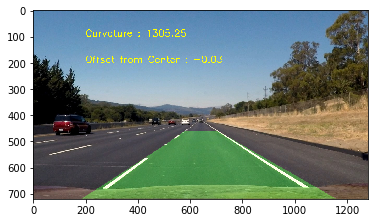

In [29]:
global M_g, Minv_g, mtx_g, dist_g, left_fit_g, right_fit_g, curvature_g
camera_calibration('camera_cal', ny=6, nx=9)
ret, mtx, dist, rvecs, tvecs = load_camera_calibration('camera_cal')


img                     = mpimg.imread('test_images/straight_lines2.jpg')
calculate_perspective_matrices(img)
M, Minv = load_perspective_matrices()
left_fit_g, right_fit_g, curvature_g = [], [], []

M_g, Minv_g, mtx_g, dist_g = M, Minv, mtx, dist


undistorted = correct_distortion(img, mtx=mtx_g, dist=dist_g)
# Sobel & Color thresholds
opts = {'sobel_kernel': 13, 'stx_min': 20,
        'stx_max': 255, 'sty_min': 20, 'sty_max': 255,
        'mt_min': 20, 'mt_max': 100, 'dt_min': -np.pi / 2, 'dt_max': 1.33,
        'ct_min': 100, 'ct_max': 255}
binary = combine_sobel_thresholds(undistorted, opts)
# Perspective transform
perspective_transformed = transform_to_top_view(binary, M=M_g)
# Fit polynomial
left_fit, right_fit, fits = fit_polynomial(
    perspective_transformed, plotit=False, nwindows=15)
# Smooth fits
left_fit, right_fit = smooth_fits(left_fit, right_fit)
# Calculate curvature
curvature_in_m,_ = calculate_curvature(
    perspective_transformed, left_fit, right_fit, fits)
offset_from_center = calc_vehicle_offset(undistorted, left_fit, right_fit)
# Warp back to road
result = warp_perspective_back(
    perspective_transformed, img, left_fit, right_fit, fits, Minv=Minv_g)
# Add curvature to image
curvature_in_m = np.mean(curvature_in_m)
curvature_in_m = smooth_curvature(curvature_in_m)
curvature_text = 'Curvature : {:.2f}'.format(curvature_in_m)
offset_text = 'Offset from Center : {:.2f}'.format(offset_from_center)
cv2.putText(result, curvature_text, (200, 100), 0, 1.2, (255, 255, 0), 2)
cv2.putText(result, offset_text, (200, 200), 0, 1.2, (255, 255, 0), 2)
plt.imshow(result)

__Submission N.2__: In order to fix the problem at frames secs 35-39 an improved pipeline has been considered with 
    color filters as suggested.  



In [30]:
wide_dist_pickle = pickle.load(open("./wide_dist_pickle.p", "rb" ))
dist = wide_dist_pickle['dist']
mtx = wide_dist_pickle['mtx']


def pipeline_process(image):
    
    global left_fit_prev   
    global right_fit_prev
    global col_R_prev
    global col_L_prev
    global set_prev
    global mask_poly_L
    global mask_poly_R
    

    # Undistort image

    image = undistort_image(image, mtx , dist)
    image = gaussian_blur(image, kernel=5)
    img_size = np.shape(image)
    
    # Define window for perspective transform
    warped,M_warp,Minv_warp = apply_perspective_transform(image)
    image_HSV = cv2.cvtColor(warped,cv2.COLOR_RGB2HSV)

    # Define color ranges and apply color mask
    yellow_hsv_low  = np.array([ 0, 100, 100])
    yellow_hsv_high = np.array([ 50, 255, 255])

    white_hsv_low  = np.array([  20,   0,   180])
    white_hsv_high = np.array([ 255,  80, 255])
    # get yellow and white masks 
    mask_yellow = color_mask(image_HSV,yellow_hsv_low,yellow_hsv_high)
    mask_white = color_mask(image_HSV,white_hsv_low,white_hsv_high)
    # Combine white and yellow masks into 1
    mask_lane = cv2.bitwise_or(mask_yellow,mask_white) 
    
    # Convert image to HLS scheme
    image_HLS = cv2.cvtColor(warped,cv2.COLOR_RGB2HLS)

    # Apply sobel filters on L and S channels.
    img_gs = image_HLS[:,:,1]
    img_abs_x = abs_sobel_thresh_2(img_gs,'x',5,(50,225))
    img_abs_y = abs_sobel_thresh_2(img_gs,'y',5,(50,225))
    wraped2 = np.copy(cv2.bitwise_or(img_abs_x,img_abs_y))
    
    img_gs = image_HLS[:,:,2]
    img_abs_x = abs_sobel_thresh_2(img_gs,'x',5,(50,255))
    img_abs_y = abs_sobel_thresh_2(img_gs,'y',5,(50,255))
    wraped3 = np.copy(cv2.bitwise_or(img_abs_x,img_abs_y))
    

    # Combine sobel filter information from L and S channels.
    image_cmb = cv2.bitwise_or(wraped2,wraped3)
    image_cmb = gaussian_blur(image_cmb,25)
    

    # Combine masks from sobel and color masks.

    image_cmb1 = np.zeros_like(image_cmb)
    image_cmb1[(mask_lane>=.5)|(image_cmb>=.5)]=1
    
    
    # If this is first frame, get new mask.
    if set_prev == 0:
        image_cmb1 = gaussian_blur(image_cmb1,5)
        mask_poly_L,mask_poly_R = get_initial_mask(image_cmb1,40)

        
        
    # Define all colors as white to start.         
    col_R = (255,255,255)
    col_L = (255,255,255)
    col_R = (255,255,255)
    col_L = (255,255,255)
    
    # Apply mask to sobel images and compute polynomial fit for left. 
    img_L = np.copy(image_cmb1)
    img_L = cv2.bitwise_and(image_cmb1,image_cmb1,
                                mask = mask_poly_L)
    vals = np.argwhere(img_L>.5)
    if len(vals)<5: ## If less than 5 points 
        left_fit = left_fit_prev
        col_L = col_L_prev
    else:
        all_x = vals.T[0]
        all_y =vals.T[1]
        left_fit = np.polyfit(all_x, all_y, 2)
        if np.sum(cv2.bitwise_and(img_L,mask_yellow))>1000:
            col_L = (255,255,0)
            
    # Apply mask to sobel images and compute polynomial fit for right. 

    img_R = np.copy(image_cmb1)
    img_R = cv2.bitwise_and(image_cmb1,image_cmb1,
                                mask = mask_poly_R)
    vals = np.argwhere(img_R>.5)
        
    if len(vals)<5:
        right_fit = right_fit_prev
        col_R = col_R_prev
    else:
        all_x = vals.T[0]
        all_y =vals.T[1]
        right_fit = np.polyfit(all_x, all_y, 2)
        if np.sum(cv2.bitwise_and(img_R,mask_yellow))>1000:
            col_R = (255,255,0)
    
    
    ## assign initial mask, and save coefficient values for next frame
            
    if set_prev == 0:
        set_prev = 1
        right_fit_prev = right_fit
        left_fit_prev  = left_fit
    
       
    ## Check error between current coefficient and on from previous frame
    err_p_R = np.sum((right_fit[0]-right_fit_prev[0])**2) #/np.sum(right_fit_prev[0]**2)
    err_p_R = np.sqrt(err_p_R)
    if err_p_R>.0005:
        right_fit = right_fit_prev
        col_R = col_R_prev
    else:
        right_fit = .05*right_fit+.95*right_fit_prev
        
    ## Check error between current coefficient and on from previous frame
    err_p_L = np.sum((left_fit[0]-left_fit_prev[0])**2) #/np.sum(right_fit_prev[0]**2)
    err_p_L = np.sqrt(err_p_L)
    if err_p_L>.0005:
        left_fit =  left_fit_prev
        col_L = col_L_prev
    else:
        left_fit =  .05* left_fit+.95* left_fit_prev
    

    ## Compute lane mask for future frame 
    mask_poly_L,left_pts,img_pts = get_mask_poly(image_cmb1,left_fit,window_size)
    mask_poly_R,right_pts,img_pts = get_mask_poly(image_cmb1,right_fit,window_size)
     
        
    ## Compute lanes
        
    right_y = np.arange(11)*img_size[0]/10
    right_fitx = right_fit[0]*right_y**2 + right_fit[1]*right_y + right_fit[2]

    left_y = np.arange(11)*img_size[0]/10
    left_fitx = left_fit[0]*left_y**2 + left_fit[1]*left_y + left_fit[2]
    
    warp_zero = np.zeros_like(image_cmb1).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, left_y]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, right_y])))])
    pts = np.hstack((pts_left, pts_right))
    

    ## Compute intercepts
    left_bot = get_val(img_size[0],left_fit)
    right_bot = get_val(img_size[0],right_fit)
    
    ## Compute center location
    val_center = (left_bot+right_bot)/2.0
    
    ## Compute lane offset
    dist_offset = val_center - img_size[1]/2
    dist_offset = np.round(dist_offset/2.81362,2)
    if abs(dist_offset) > 70:
        print("abs(dist_offset) > 70:")
    str_offset = 'Lane deviation: ' + str(dist_offset) + ' cm.'
    
    if dist_offset>30:
        cv2.fillPoly(color_warp, np.int_([pts]), (255,0, 0))
    else:
        cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 255))
        

    # Draw the lane onto the warped blank image    
    draw_pw_lines(color_warp,np.int_(pts_left),col_L)
    draw_pw_lines(color_warp,np.int_(pts_right),col_R)
    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    
    newwarp = cv2.warpPerspective(color_warp, Minv_warp, (image.shape[1], image.shape[0])) 
    # Combine the result with the original image
    result = cv2.addWeighted(image, 1, newwarp, 0.5, 0)
    
    left_curve = get_curvature(left_fit,img_size[0]/2)
    Right_curve = get_curvature(right_fit,img_size[0]/2)
    
    str_curv = 'Curvature: Right = ' + str(np.round(Right_curve,2)) + ', Left = ' + str(np.round(left_curve,2)) 
    # Change color if distance is more than 30 cm
    font = cv2.FONT_HERSHEY_COMPLEX    
    if dist_offset<30:
        cv2.putText(result, str_curv, (30, 60), font, 1, (0,255,0), 2)
        cv2.putText(result, str_offset, (30, 90), font, 1, (0,255,0), 2)
    else:
        cv2.putText(result, str_curv, (30, 60), font, 1, (255,0,0), 2)
        cv2.putText(result, str_offset, (30, 90), font, 1, (255,0,0), 2)
    
    
    
    right_fit_prev = right_fit
    left_fit_prev  = left_fit
    col_R_prev = col_R
    col_L_prev = col_L
    
    
    #return result    # using cv2 for drawing text in diagnostic pipeline.
    
    if do_diagnosis == 1:
        font = cv2.FONT_HERSHEY_COMPLEX
        middlepanel = np.zeros((120, 1280, 3), dtype=np.uint8)
        cv2.putText(middlepanel, str_curv, (30, 60), font, 1, (255,0,0), 2)
        cv2.putText(middlepanel, str_offset, (30, 90), font, 1, (255,0,0), 2)
    
        # assemble the screen example
        diagScreen = np.zeros((1080, 1920, 3), dtype=np.uint8)
        diagScreen[0:720, 0:1280] = result
        diagScreen[0:240, 1280:1600] = cv2.resize(warped, (320,240), interpolation=cv2.INTER_AREA) 
        diagScreen[0:240, 1600:1920] = cv2.resize(stack_arr(mask_lane), (320,240), interpolation=cv2.INTER_AREA)
        diagScreen[240:480, 1280:1600] = cv2.resize(apply_color_mask(image_HSV,warped,yellow_hsv_low,yellow_hsv_high), (320,240), interpolation=cv2.INTER_AREA)
        diagScreen[240:480, 1600:1920] = cv2.resize(apply_color_mask(image_HSV,warped,white_hsv_low,white_hsv_high), (320,240), interpolation=cv2.INTER_AREA)*4
        diagScreen[600:1080, 1280:1920] = cv2.resize(color_warp, (640,480), interpolation=cv2.INTER_AREA)*4
        diagScreen[720:840, 0:1280] = middlepanel
        diagScreen[840:1080, 0:320] = cv2.resize(newwarp, (320,240), interpolation=cv2.INTER_AREA)
    
        diagScreen[840:1080, 320:640] = cv2.resize(stack_arr(255*image_cmb1), (320,240), interpolation=cv2.INTER_AREA)
        diagScreen[840:1080, 640:960] = cv2.resize(stack_arr(255*mask_poly_L+255*mask_poly_R), (320,240), interpolation=cv2.INTER_AREA)
        diagScreen[840:1080, 960:1280] = cv2.resize(stack_arr(255*cv2.bitwise_and(image_cmb1,image_cmb1,
                                                                              mask=mask_poly_L+mask_poly_R)),
                                                (320,240), interpolation=cv2.INTER_AREA)
        return diagScreen
    else:
        return result

test_images\straight_lines1.jpg


C:\Users\gtesei\AppData\Local\Continuum\Miniconda3\envs\carnd-term1\lib\site-packages\scipy\signal\_peak_finding.py:412: RuntimeWarning: divide by zero encountered in double_scalars
  snr = abs(cwt[line[0][0], line[1][0]] / noises[line[1][0]])


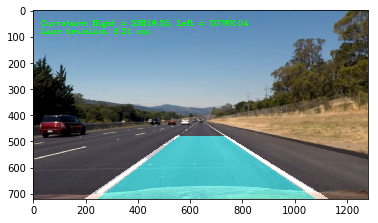

test_images\straight_lines2.jpg


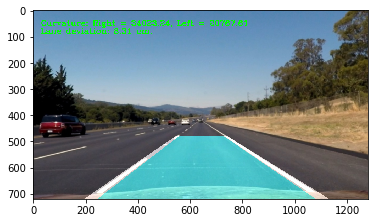

test_images\test1.jpg


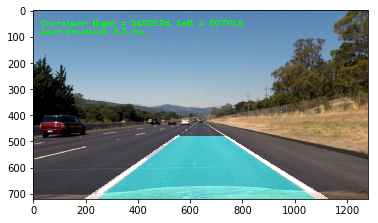

test_images\test2.jpg


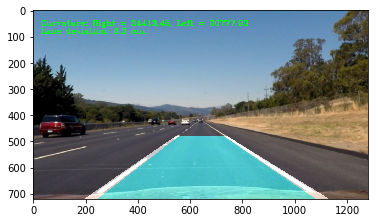

test_images\test3.jpg


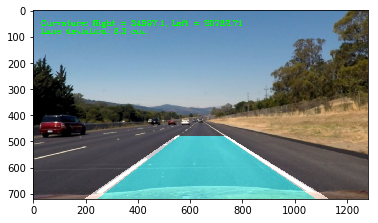

test_images\test4.jpg


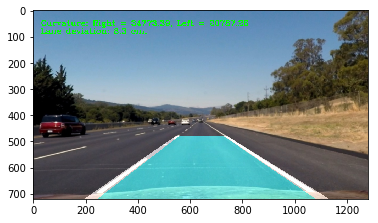

test_images\test5.jpg


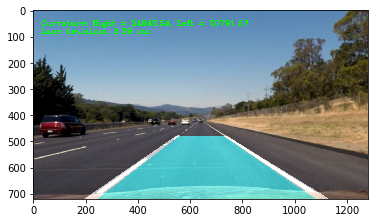

test_images\test6.jpg


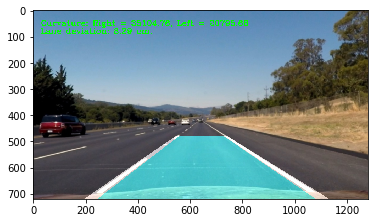

In [31]:
#vertices to mask and get region of interest
left_bottom = (100, 720)
right_bottom = (1260, 720)
apex1 = (610, 410)
apex2 = (680, 410)
inner_left_bottom = (310, 720)
inner_right_bottom = (1150, 720)
inner_apex1 = (700,480)
inner_apex2 = (650,480)
vertices = np.array([[left_bottom, apex1, apex2, right_bottom, inner_right_bottom, inner_apex1, inner_apex2, inner_left_bottom]], 
                    dtype=np.int32)


def region_of_interest(img, vertices):
    """
    Applies an image mask.
    
    Only keeps the region of the image defined by the polygon
    formed from `vertices`. The rest of the image is set to black.
    """
    #defining a blank mask to start with
    mask = np.zeros_like(img)   
    
    #defining a 3 channel or 1 channel color to fill the mask with depending on the input image
    if len(img.shape) > 2:
        channel_count = img.shape[2]  # i.e. 3 or 4 depending on your image
        ignore_mask_color = (255,) * channel_count
    else:
        ignore_mask_color = 255
        
    #filling pixels inside the polygon defined by "vertices" with the fill color    
    cv2.fillPoly(mask, vertices, ignore_mask_color)
    
    #returning the image only where mask pixels are nonzero
    masked_image = cv2.bitwise_and(img, mask)
    return masked_image


def process_image(img):
    undistorted = correct_distortion(img, mtx=mtx_g, dist=dist_g)
    # Sobel & Color thresholds
    opts = {'sobel_kernel': 13, 'stx_min': 20,
            'stx_max': 255, 'sty_min': 20, 'sty_max': 255,
            'mt_min': 20, 'mt_max': 100, 'dt_min': -np.pi / 2, 'dt_max': 1.33,
            'ct_min': 100, 'ct_max': 255}
    binary = combine_sobel_thresholds(undistorted, opts)
    
    
    # Masked area
    binary = region_of_interest(binary, vertices)
    
    # Perspective transform
    perspective_transformed = transform_to_top_view(binary, M=M_g)
    # Fit polynomial
    left_fit, right_fit, fits = fit_polynomial(
        perspective_transformed, plotit=False, nwindows=15)
    # Smooth fits
    left_fit, right_fit = smooth_fits(left_fit, right_fit)
    # Calculate curvature
    curvature_in_m,_ = calculate_curvature(perspective_transformed, left_fit, right_fit, fits)
    offset_from_center = calc_vehicle_offset(undistorted, left_fit, right_fit)
    # Warp back to road
    result = warp_perspective_back(
        perspective_transformed, img, left_fit, right_fit, fits, Minv=Minv_g)
    # Add curvature to image
    curvature_in_m = np.mean(curvature_in_m)
    curvature_in_m = smooth_curvature(curvature_in_m)
    curvature_text = 'Curvature : {:.2f}'.format(curvature_in_m)
    offset_text = 'Offset from Center : {:.2f}'.format(offset_from_center)
    cv2.putText(result, curvature_text, (200, 100), 0, 1.2, (255, 255, 0), 2)
    cv2.putText(result, offset_text, (200, 200), 0, 1.2, (255, 255, 0), 2)
        
    return result



# Define kernel size for filters
kernel_size = 5
# Define size for sliding windows
window_size = 60


set_prev = 0
do_diagnosis = 0

from scipy.signal import find_peaks_cwt

import glob
images = glob.glob('test_images/*.jpg')
for idx, fname in enumerate(images):
    print(fname,flush=True)
    img_ann = pipeline_process(img)
    #img_ann = process_image(img)
    imsave('output_images/'+str(idx)+'_annotated.png', img_ann)
    plt.imshow(img_ann)
    plt.show()

# Clip

In [32]:
wide_dist_pickle = pickle.load(open("./wide_dist_pickle.p", "rb" ))
dist = wide_dist_pickle['dist']
mtx = wide_dist_pickle['mtx']

# Define kernel size for filters
kernel_size = 5
# Define size for sliding windows
window_size = 60


set_prev = 0
do_diagnosis = 0

from scipy.signal import find_peaks_cwt
from moviepy.editor import VideoFileClip
clip2 = VideoFileClip("project_video.mp4")

clip = clip2.fl_image(pipeline_process)
clip.write_videofile("project_video_with_laned_annotated.mp4", audio=False)

[MoviePy] >>>> Building video project_video_with_laned_annotated.mp4
[MoviePy] Writing video project_video_with_laned_annotated.mp4


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 1260/1261 [04:54<00:00,  4.41it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_with_laned_annotated.mp4 

